In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install tensorflow

In [ ]:
!pip install keras-tuner

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.9/128.9 kB 3.4 MB/s eta 0:00:00


In [ ]:
import matplotlib.pyplot as plt

import numpy as np
import seaborn as sns

import plotly.graph_objects as go
import plotly.express as px

from scipy.io import loadmat

import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import (accuracy_score,precision_score,recall_score,
                             confusion_matrix, classification_report)

import tensorflow as tf

from tqdm import tqdm
from numpy.random import seed
from time import time




# **Loading Indian Pines Data**

In [ ]:
ip_data= loadmat('/content/drive/MyDrive/Data/HYS/Indian_pines_corrected.mat')['indian_pines_corrected']
ip_gt= loadmat('/content/drive/MyDrive/Data/HYS/Indian_pines_gt.mat')['indian_pines_gt']

In [ ]:
ip_data.shape

(145, 145, 200)

Storing the 3D Hyperspectral data into a 2D dataframe for ease of use

In [ ]:
df_ip = pd.DataFrame(ip_data.reshape(ip_data.shape[0]*ip_data.shape[1],-1))
df_ip.columns = pd.Index(['band' + str(i) for i in range(1, df_ip.shape[-1] + 1)])
df_ip['class'] = ip_gt.ravel()

In [ ]:
df_ip.shape

(21025, 201)

# **Loading Salinas Data**

In [ ]:
sal_data= loadmat('/content/drive/MyDrive/Data/HYS/Salinas_corrected.mat')['salinas_corrected']
sal_gt= loadmat('/content/drive/MyDrive/Data/HYS/Salinas_gt.mat')['salinas_gt']

Storing the 3D Hyperspectral data into a 2D dataframe for ease of use

In [ ]:
df_sal = pd.DataFrame(sal_data.reshape(sal_data.shape[0]*sal_data.shape[1],-1))
df_sal.columns = pd.Index(['band' + str(i) for i in range(1, df_sal.shape[-1] + 1)])
df_sal['class'] = sal_gt.ravel()

In [ ]:
df_sal.shape

(111104, 205)

# Loading Pavia University Data

In [ ]:
pav_data= loadmat('/content/drive/MyDrive/Data/HYS/PaviaU.mat')['paviaU']
pav_gt= loadmat('/content/drive/MyDrive/Data/HYS/PaviaU_gt.mat')['paviaU_gt']

Storing the 3D Hyperspectral data into a 2D dataframe for ease of use

In [ ]:
df_pav = pd.DataFrame(pav_data.reshape(pav_data.shape[0]*pav_data.shape[1],-1))
df_pav.columns = pd.Index(['band' + str(i) for i in range(1, df_pav.shape[-1] + 1)])
df_pav['class'] = pav_gt.ravel()

In [ ]:
df_pav.shape

(207400, 104)

# Indian Pines Data Visualization

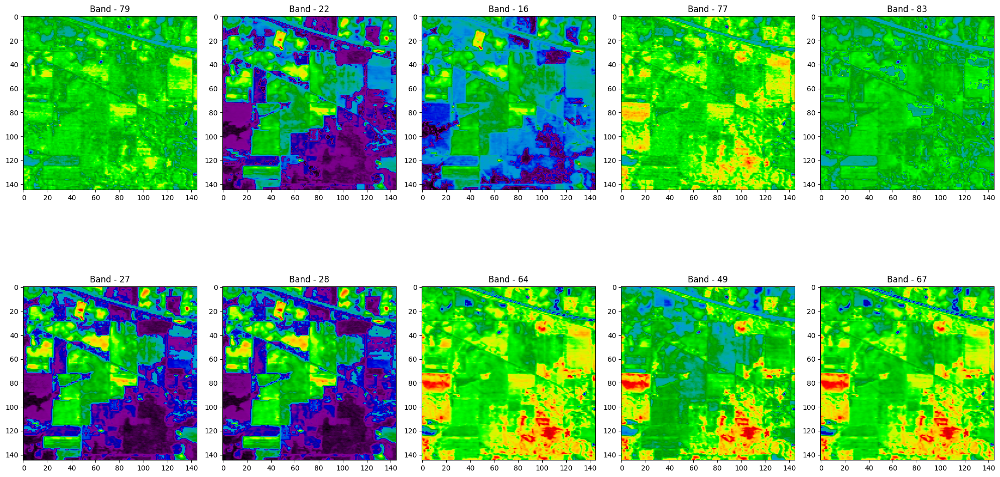

In [ ]:
fig = plt.figure(figsize = (20, 12))

ax = fig.subplots(2, 5)

for i in range(2):
  for j in range(5):
    c = np.random.randint(103)
    ax[i][j].imshow(ip_data[:, :, c], cmap='nipy_spectral')
    ax[i][j].axis('on')
    ax[i][j].title.set_text(f"Band - {c}")
    c+=1

plt.tight_layout()
plt.show()

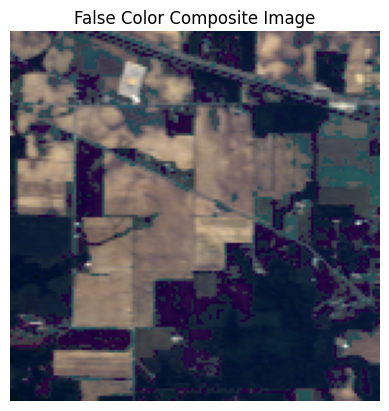

In [ ]:
band_r =ip_data[:, :, 29]
band_g = ip_data[:, :, 19]
band_b = ip_data[:, :, 9]
band_r = (band_r - band_r.min()) / (band_r.max() - band_r.min())
band_g = (band_g - band_g.min()) / (band_g.max() - band_g.min())
band_b = (band_b - band_b.min()) / (band_b.max() - band_b.min())
false_color_img = np.dstack((band_r, band_g, band_b))
plt.imshow(false_color_img)
plt.title('False Color Composite Image')
plt.axis('off')
plt.show()

Band Ratioing

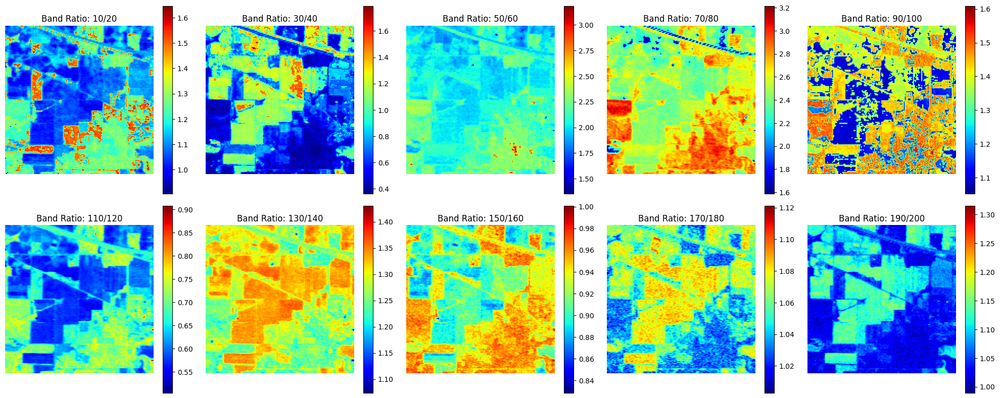

In [ ]:
band_pairs = [(10, 20), (30, 40), (50, 60), (70, 80), (90, 100),
              (110, 120), (130, 140), (150, 160), (170, 180), (190, 200)]

fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.ravel()

for i, (band1_idx, band2_idx) in enumerate(band_pairs):
    # Adjusting for zero-indexing
    band1 = ip_data[:, :, band1_idx - 1]
    band2 = ip_data[:, :, band2_idx - 1]
    band2 = np.where(band2 == 0, np.nan, band2)
    band_ratio = band1 / band2
    ax = axes[i]
    cax = ax.imshow(band_ratio, cmap='jet')
    ax.set_title(f'Band Ratio: {band1_idx}/{band2_idx}')
    ax.axis('off')
    fig.colorbar(cax, ax=ax)

plt.tight_layout()
plt.show()



# **Salinas Data Visualization**

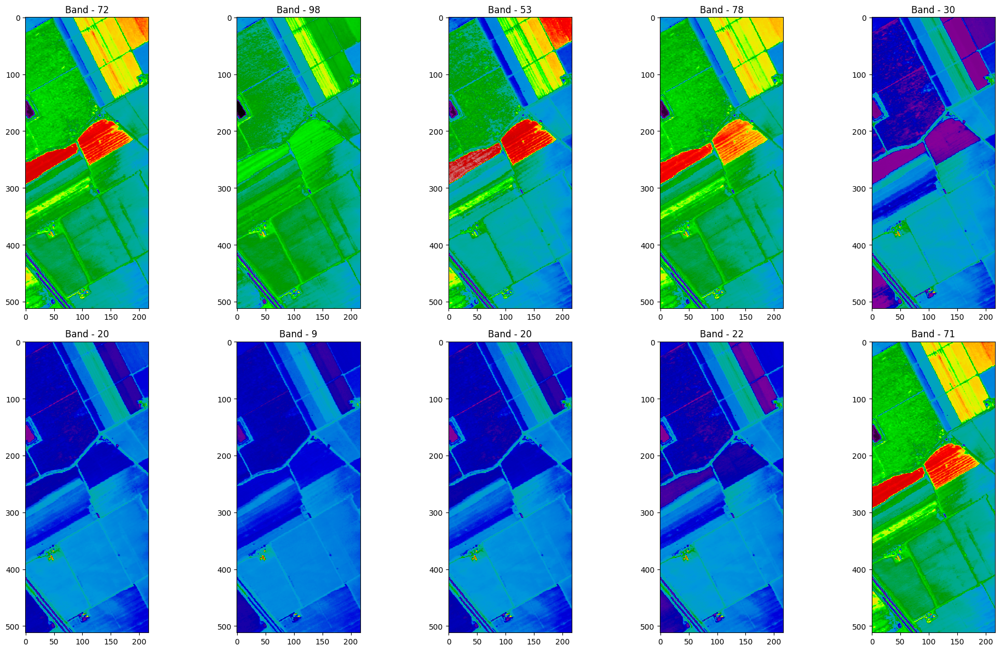

In [ ]:
fig = plt.figure(figsize = (20, 12))

ax = fig.subplots(2, 5)

for i in range(2):
  for j in range(5):
    c = np.random.randint(103)
    ax[i][j].imshow(sal_data[:, :, c], cmap='nipy_spectral')
    ax[i][j].axis('on')
    ax[i][j].title.set_text(f"Band - {c}")
    c+=1

plt.tight_layout()
plt.show()

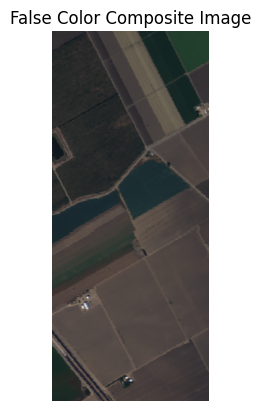

In [ ]:
band_r =sal_data[:, :, 29]
band_g = sal_data[:, :, 19]
band_b = sal_data[:, :, 9]
band_r = (band_r - band_r.min()) / (band_r.max() - band_r.min())
band_g = (band_g - band_g.min()) / (band_g.max() - band_g.min())
band_b = (band_b - band_b.min()) / (band_b.max() - band_b.min())
false_color_img = np.dstack((band_r, band_g, band_b))
plt.imshow(false_color_img)
plt.title('False Color Composite Image')
plt.axis('off')
plt.show()

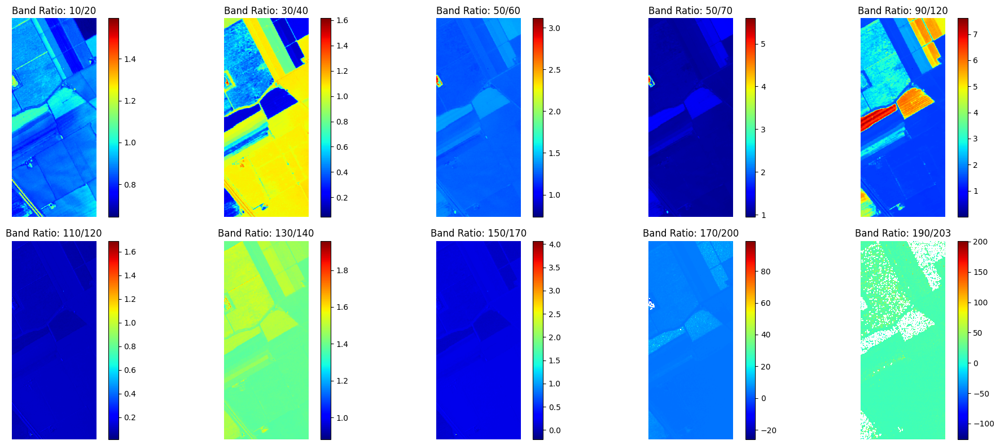

In [ ]:
band_pairs = [(10, 20), (30, 40), (50, 60), (50, 70), (90, 120),
              (110, 120), (130, 140), (150, 170), (170, 200), (190, 203)]

fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.ravel()

for i, (band1_idx, band2_idx) in enumerate(band_pairs):
    # Adjusting for zero-indexing
    band1 = sal_data[:, :, band1_idx - 1]
    band2 = sal_data[:, :, band2_idx - 1]
    band2 = np.where(band2 == 0, np.nan, band2)
    band_ratio = band1 / band2
    ax = axes[i]
    cax = ax.imshow(band_ratio, cmap='jet')
    ax.set_title(f'Band Ratio: {band1_idx}/{band2_idx}')
    ax.axis('off')
    fig.colorbar(cax, ax=ax)

plt.tight_layout()
plt.show()



# **Pavia Data Visualization**

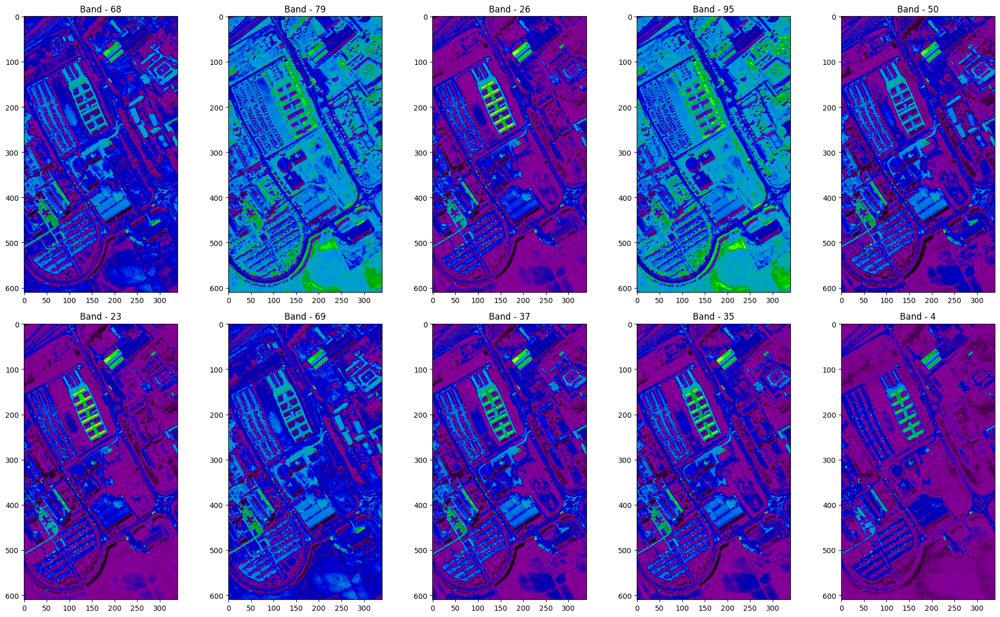

In [ ]:
fig = plt.figure(figsize = (20, 12))

ax = fig.subplots(2, 5)

for i in range(2):
  for j in range(5):
    c = np.random.randint(103)
    ax[i][j].imshow(pav_data[:, :, c], cmap='nipy_spectral')
    ax[i][j].axis('on')
    ax[i][j].title.set_text(f"Band - {c}")
    c+=1

plt.tight_layout()
plt.show()

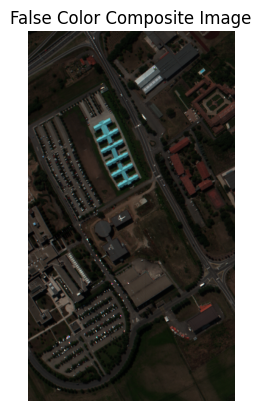

In [ ]:
band_r =pav_data[:, :, 49]
band_g = pav_data[:, :, 26]
band_b = pav_data[:, :, 16]
band_r = (band_r - band_r.min()) / (band_r.max() - band_r.min())
band_g = (band_g - band_g.min()) / (band_g.max() - band_g.min())
band_b = (band_b - band_b.min()) / (band_b.max() - band_b.min())
false_color_img = np.dstack((band_r, band_g, band_b))
plt.imshow(false_color_img)
plt.title('False Color Composite Image')
plt.axis('off')
plt.show()

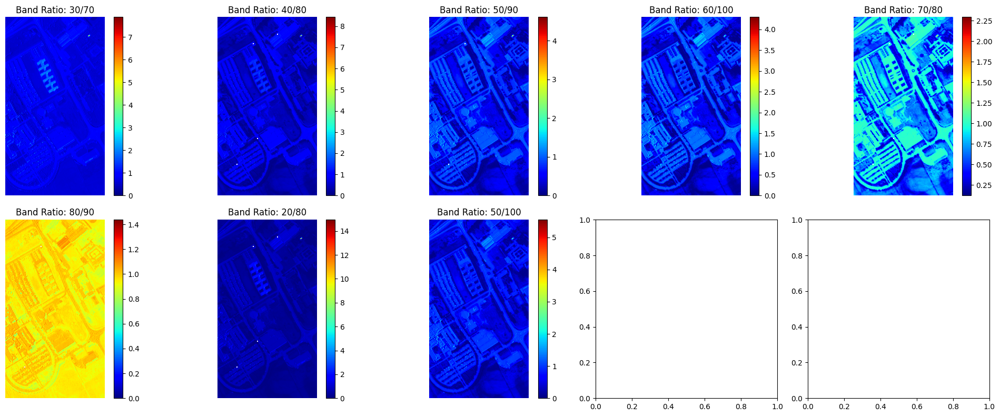

In [ ]:
band_pairs = [(30, 70), (40, 80), (50, 90),
              (60, 100), (70, 80), (80, 90), (20, 80), (50, 100)]

fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.ravel()

for i, (band1_idx, band2_idx) in enumerate(band_pairs):
    # Adjusting for zero-indexing
    band1 = pav_data[:, :, band1_idx - 1]
    band2 = pav_data[:, :, band2_idx - 1]
    band2 = np.where(band2 == 0, np.nan, band2)
    band_ratio = band1 / band2
    ax = axes[i]
    cax = ax.imshow(band_ratio, cmap='jet')
    ax.set_title(f'Band Ratio: {band1_idx}/{band2_idx}')
    ax.axis('off')
    fig.colorbar(cax, ax=ax)

plt.tight_layout()
plt.show()



# Build CNN Indian Pines

In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.utils import to_categorical

def create_patches(data, gt, window_size=5):
    """
    Create patches from the hyperspectral data for each pixel with its surrounding context.

    :param data: Hyperspectral data (3D array).
    :param gt: Ground truth (2D array).
    :param window_size: Size of the square window.
    :return: Patches and their corresponding labels.
    """
    margin = window_size // 2
    height, width = gt.shape
    patches = []
    labels = []

    for row in range(margin, height - margin):
        for col in range(margin, width - margin):
            if gt[row, col] != 0:  # Exclude background
                patch = data[row - margin:row + margin + 1, col - margin:col + margin + 1, :]
                patches.append(patch)
                labels.append(gt[row, col])

    return np.array(patches), np.array(labels)

# Normalize the hyperspectral data
scaler = StandardScaler()
hyperspectral_data_normalized = scaler.fit_transform(ip_data.reshape(-1, ip_data.shape[2])).reshape(ip_data.shape)

# Create patches
window_size = 5  # Example window size
patches, labels = create_patches(hyperspectral_data_normalized, ip_gt, window_size)

# One-hot encode the labels
labels_encoded = to_categorical(labels)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(patches, labels_encoded, test_size=0.2, random_state=42)

X_train.shape, y_train.shape, X_test.shape, y_test.shape



((8068, 5, 5, 200), (8068, 17), (2018, 5, 5, 200), (2018, 17))

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Flatten, Dense, Dropout, BatchNormalization

def build_cnn(input_shape, num_classes):
    model = Sequential()

    # Convolutional layers
    model.add(Conv2D(filters=32, kernel_size=(3, 3), activation='relu', input_shape=input_shape))
    model.add(BatchNormalization())
    model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
    model.add(BatchNormalization())
    model.add(Flatten())

    # Dense layers
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(num_classes, activation='softmax'))

    return model

In [ ]:
model = build_cnn(input_shape=X_train.shape[1:], num_classes=y_train.shape[1])
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(X_train, y_train, batch_size=32, epochs=10, validation_split=0.2)


Epoch 1/10
202/202 [==============================] - 5s 12ms/step - loss: 1.4637 - accuracy: 0.5206 - val_loss: 0.8426 - val_accuracy: 0.7076
Epoch 2/10
202/202 [==============================] - 1s 6ms/step - loss: 0.8550 - accuracy: 0.7020 - val_loss: 0.5936 - val_accuracy: 0.7906
Epoch 3/10
202/202 [==============================] - 1s 7ms/step - loss: 0.5955 - accuracy: 0.7918 - val_loss: 0.4268 - val_accuracy: 0.8451
Epoch 4/10
202/202 [==============================] - 1s 7ms/step - loss: 0.4892 - accuracy: 0.8308 - val_loss: 0.3234 - val_accuracy: 0.8947
Epoch 5/10
202/202 [==============================] - 2s 8ms/step - loss: 0.4398 - accuracy: 0.8451 - val_loss: 0.4008 - val_accuracy: 0.8414
Epoch 6/10
202/202 [==============================] - 2s 8ms/step - loss: 0.3270 - accuracy: 0.8866 - val_loss: 0.1873 - val_accuracy: 0.9387
Epoch 7/10
202/202 [==============================] - 1s 5ms/step - loss: 0.3087 - accuracy: 0.8946 - val_loss: 0.2905 - val_accuracy: 0.8835
Epoch

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {test_accuracy:.4f}")

64/64 [==============================] - 1s 12ms/step - loss: 0.1902 - accuracy: 0.9272
Test Accuracy: 0.9272


# Build LSTM

In [ ]:
nsamples, nx, ny = hyperspectral_data_normalized.shape
lstm_data = hyperspectral_data_normalized.reshape((nsamples*nx, ny))

In [ ]:
gt_flattened = ip_gt.flatten()
lstm_data = lstm_data[gt_flattened != 0]
gt_flattened = gt_flattened[gt_flattened != 0]

In [ ]:
labels_encoded = to_categorical(gt_flattened)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(lstm_data, labels_encoded, test_size=0.2, random_state=42)

X_train.shape, y_train.shape, X_test.shape, y_test.shape

((8199, 200), (8199, 17), (2050, 200), (2050, 17))

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

def build_lstm(input_shape, num_classes):
    model = Sequential()

    # LSTM layers
    model.add(LSTM(units=64, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(0.5))
    model.add(LSTM(units=32))
    model.add(Dropout(0.5))

    # Dense layer for classification
    model.add(Dense(num_classes, activation='softmax'))

    return model

# Building the model
model = build_lstm(input_shape=(X_train.shape[1], 1), num_classes=y_train.shape[1])
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


In [ ]:
# Training the model
model.fit(X_train, y_train, batch_size=32, epochs=10, validation_split=0.2)

# Testing the model
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {test_accuracy:.4f}")


Epoch 1/10
205/205 [==============================] - 10s 21ms/step - loss: 1.9374 - accuracy: 0.3606 - val_loss: 1.5561 - val_accuracy: 0.4640
Epoch 2/10
205/205 [==============================] - 4s 17ms/step - loss: 1.6683 - accuracy: 0.4272 - val_loss: 1.7002 - val_accuracy: 0.4262
Epoch 3/10
205/205 [==============================] - 4s 21ms/step - loss: 1.6257 - accuracy: 0.4187 - val_loss: 1.5465 - val_accuracy: 0.4085
Epoch 4/10
205/205 [==============================] - 4s 20ms/step - loss: 1.5515 - accuracy: 0.4488 - val_loss: 1.4275 - val_accuracy: 0.4701
Epoch 5/10
205/205 [==============================] - 3s 15ms/step - loss: 1.5412 - accuracy: 0.4540 - val_loss: 1.5256 - val_accuracy: 0.4317
Epoch 6/10
205/205 [==============================] - 3s 17ms/step - loss: 1.5054 - accuracy: 0.4664 - val_loss: 1.4342 - val_accuracy: 0.4622
Epoch 7/10
205/205 [==============================] - 4s 19ms/step - loss: 1.4662 - accuracy: 0.4749 - val_loss: 1.3851 - val_accuracy: 0.468

# Build Combined Model

In [ ]:
nsamples, nx, ny = ip_data.shape
data_reshaped = ip_data.reshape((nsamples * nx, ny))
scaler = StandardScaler()
data_normalized = scaler.fit_transform(data_reshaped)
data_normalized = data_normalized.reshape((nsamples, nx, ny))


In [ ]:
def create_patches(data, gt, window_size=5):
    margin = window_size // 2
    height, width = gt.shape
    patches = []
    labels = []

    for row in range(margin, height - margin):
        for col in range(margin, width - margin):
            if gt[row, col] > 0:  # Exclude the background
                patch = data[row - margin:row + margin + 1, col - margin:col + margin + 1, :]
                patches.append(patch)
                labels.append(gt[row, col])

    return np.array(patches), np.array(labels)


In [ ]:
window_size = 5  # Example window size
patches, labels = create_patches(data_normalized, ip_gt, window_size)
nsamples, patch_size, _, nbands = patches.shape
patches_reshaped = patches.reshape(nsamples, patch_size * patch_size, nbands)


In [ ]:
labels_encoded = to_categorical(labels)
X_train, X_test, y_train, y_test = train_test_split(patches_reshaped, labels_encoded, test_size=0.2, random_state=42)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, LSTM, Dense, Dropout, Flatten, TimeDistributed, Reshape

def build_cnn_lstm(input_shape, num_classes):
    model = Sequential()

    # CNN layers
    model.add(TimeDistributed(Conv2D(filters=32, kernel_size=(3, 3), activation='relu'), input_shape=input_shape))
    model.add(TimeDistributed(Conv2D(filters=64, kernel_size=(3, 3), activation='relu')))
    model.add(TimeDistributed(Flatten()))

    # Reshaping for LSTM
    model.add(Reshape((input_shape[0], -1)))

    # LSTM layers
    model.add(LSTM(units=64, return_sequences=True))
    model.add(Dropout(0.5))
    model.add(LSTM(units=32))
    model.add(Dropout(0.5))

    # Dense layer for classification
    model.add(Dense(num_classes, activation='softmax'))

    return model

# Determine the input shape based on your data


In [ ]:
input_shape = (window_size, window_size, ip_data.shape[2], 1)
num_classes = y_train.shape[1]

model = build_cnn_lstm(input_shape, num_classes)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
# Training the model
model.fit(X_train, y_train, batch_size=32, epochs=10, validation_split=0.2)

# Testing the model
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {test_accuracy:.4f}")


Epoch 1/10


ValueError: ignored

In [ ]:
from keras.utils import to_categorical
labels_one_hot = to_categorical(ip_gt)

In [ ]:
history = model.fit(data_normalized, labels_one_hot, epochs=10, batch_size=32, validation_split=0.2)

Epoch 1/10


ValueError: ignored

In [ ]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np
from sklearn.model_selection import train_test_split

# Normalize the data
scaler = MinMaxScaler()
data_reshaped = ip_data.reshape(-1, ip_data.shape[2])
data_normalized = scaler.fit_transform(data_reshaped)
data_normalized = data_normalized.reshape(ip_data.shape)

# Splitting the data into training and testing
# For simplicity, let's use a small portion of the data for training and testing
X_train, X_test, y_train, y_test = train_test_split(
    data_normalized, ip_gt, test_size=0.3, random_state=42
)

# Reshape data for CNN (adding a channel dimension)
X_train_cnn = np.expand_dims(X_train, axis=-1)
X_test_cnn = np.expand_dims(X_test, axis=-1)

# Reshape data for LSTM (flattening spatial dimensions)
X_train_lstm = X_train.reshape(X_train.shape[0]*X_train.shape[1], -1, X_train.shape[2])
X_test_lstm = X_test.reshape(X_test.shape[0]*X_test.shape[1], -1, X_test.shape[2])

X_train_cnn.shape, X_train_lstm.shape, y_train.shape, X_test_cnn.shape, X_test_lstm.shape, y_test.shape



((101, 145, 200, 1),
 (14645, 1, 200),
 (101, 145),
 (44, 145, 200, 1),
 (6380, 1, 200),
 (44, 145))

In [ ]:
import numpy as np
from tensorflow.keras.utils import to_categorical

def create_patches(data, ground_truth, patch_size=5, remove_zeros=True):
    margin = patch_size // 2
    height, width = ip_gt.shape
    patches = []
    spectral_data = []
    labels = []

    for i in range(margin, height - margin):
        for j in range(margin, width - margin):
            patch = data[i - margin:i + margin + 1, j - margin:j + margin + 1, :]
            spectral_vector = ip_data[i, j, :]
            label = ip_gt[i, j]

            if remove_zeros and label == 0:
                continue

            patches.append(patch)
            spectral_data.append(spectral_vector)
            labels.append(label)

    return np.array(patches,dtype=object), np.array(spectral_data, dtype=object), np.array(labels, dtype=object)

# Define patch size
patch_size = 5

# Create patches for training and testing data
X_train_patches, X_train_spectral, y_train_labels = create_patches(X_train, y_train, patch_size=patch_size)
X_test_patches, X_test_spectral, y_test_labels = create_patches(X_test, y_test, patch_size=patch_size)

# Reshape spectral data for LSTM (adding an extra dimension)
X_train_spectral = np.expand_dims(X_train_spectral, axis=1)
X_test_spectral = np.expand_dims(X_test_spectral, axis=1)

# Convert labels to categorical
num_classes = len(np.unique(ip_gt)) - 1
y_train_categorized = to_categorical(y_train_labels, num_classes+1)[:, 1:]  # exclude the background class
y_test_categorized = to_categorical(y_test_labels, num_classes+1)[:, 1:]   # exclude the background class

print(X_train_patches.shape, X_train_spectral.shape, y_train_categorized.shape)
print(X_test_patches.shape, X_test_spectral.shape, y_test_categorized.shape)


(10086,) (10086, 1, 200) (10086, 16)
(10086,) (10086, 1, 200) (10086, 16)


In [ ]:
Input(shape=X_train_patches.shape[1:])

<KerasTensor: shape=(None,) dtype=float32 (created by layer 'input_7')>

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, LSTM, Dense, concatenate

# Define the CNN model for spatial features
input_cnn = Input(shape=X_train_patches.shape[1:])
cnn = Conv2D(32, (3, 3), activation='relu', padding='same')(input_cnn)
cnn = MaxPooling2D((2, 2))(cnn)
cnn = Conv2D(64, (3, 3), activation='relu', padding='same')(cnn)
cnn = MaxPooling2D((2, 2))(cnn)
cnn = Flatten()(cnn)

# Define the LSTM model for spectral features
input_lstm = Input(shape=X_train_spectral.shape[1:])
lstm = LSTM(64, return_sequences=False)(input_lstm)

# Combine the outputs of the CNN and LSTM
combined = concatenate([cnn, lstm])

# Fully connected layers
dense = Dense(128, activation='relu')(combined)
output = Dense(num_classes, activation='softmax')(dense)

# Create the model
model = Model(inputs=[input_cnn, input_lstm], outputs=output)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


ValueError: ignored

In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


In [ ]:
history = model.fit(
    [X_train_cnn, X_train_lstm], y_train_categorized,
    validation_data=([X_test_cnn, X_test_lstm], y_test_categorized),
    epochs=10,  # You can change the number of epochs based on your needs
    batch_size=32
)


ValueError: ignored